#Load data

In [0]:
#df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/snalla3@gmu.edu/star_classification-2.csv")
df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dnalla2@gmu.edu/star_classification-2.csv")
#df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/ptummala2@gmu.edu/star_classification-2.csv")
#df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/nyerrami@gmu.edu/star_classification-2.csv")

### Display contents of dataframe

In [0]:
display(df1)

obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
1237660961327743232,135.6891066036,32.4946318397087,23.87882,22.2753,20.39501,19.16573,18.79371,3606,301,2,79,6543777369295181824,GALAXY,0.6347936,5812,56354,171
1237664879951151360,144.826100550256,31.2741848944939,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,11760142036707334144,GALAXY,0.779136,10445,58158,427
1237660961330430208,142.188789562506,35.5824441819976,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5152200256025548800,GALAXY,0.6441945,4576,55592,299
1237663478724297984,338.741037753146,-0.402827574587482,22.13682,23.77656,21.61162,20.50454,19.2501,4192,301,3,214,10301071412954421248,GALAXY,0.9323456,9149,58039,775
1237680272041378048,345.282593210935,21.1838656010284,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6891864880783316992,GALAXY,0.1161227,6121,56187,842
1237680272039609088,340.995120509191,20.5894762801019,23.48827,23.33776,21.32195,20.25615,19.54544,8102,301,3,110,5658976714552006656,QSO,1.424659,5026,55855,741
1237678858481565952,23.2349264301638,11.4181876197835,21.46973,21.17624,20.92829,20.60826,20.42573,7773,301,2,462,1.2462617271914e+19,QSO,0.5864546,11069,58456,113
1237678858473963776,5.43317603738404,12.0651859913473,22.24979,22.02172,20.34126,19.48794,18.84999,7773,301,2,346,6961443351364392960,GALAXY,0.477009,6183,56210,15
1237661435386659840,200.290475389797,47.199402322911,24.40286,22.35669,20.61032,19.4649,18.95852,3716,301,5,108,7459284627188111360,GALAXY,0.660012,6625,56386,719
1237670961088168192,39.1496905996484,28.1028416109607,21.74669,20.03493,19.17553,18.81823,18.65422,5934,301,4,122,2751763212482406400,STAR,-7.895373e-06,2444,54082,232


#Data Cleaning

The code snippet iterates through columns in the PySpark DataFrame `df1` and converts specified columns to either integer or double data types.

In [0]:
from pyspark.sql.functions import col

# Columns to convert to integer
int_columns = ["run_ID", "rerun_ID", "cam_col","field_ID","plate","MJD","fiber_ID"]

# Get the list of all columns in the DataFrame
all_columns = df1.columns

# Iterate through all columns and convert to integer or double accordingly
for col_name in all_columns:
    if col_name in int_columns:
        df1 = df1.withColumn(col_name, col(col_name).cast("int"))
    elif col_name != "class":
        df1 = df1.withColumn(col_name, col(col_name).cast("double"))


**Checking for missing values**

In [0]:
from pyspark.sql.functions import col, count, when

# Checking for missing values in each column
df1.select([count(when(col(c).isNull(), c)).alias(c) for c in df1.columns]).show()

+------+-----+-----+---+---+---+---+---+------+--------+-------+--------+-----------+-----+--------+-----+---+--------+
|obj_ID|alpha|delta|  u|  g|  r|  i|  z|run_ID|rerun_ID|cam_col|field_ID|spec_obj_ID|class|redshift|plate|MJD|fiber_ID|
+------+-----+-----+---+---+---+---+---+------+--------+-------+--------+-----------+-----+--------+-----+---+--------+
|     0|    0|    0|  0|  0|  0|  0|  0|     0|       0|      0|       0|          0|    0|       0|    0|  0|       0|
+------+-----+-----+---+---+---+---+---+------+--------+-------+--------+-----------+-----+--------+-----+---+--------+



In [0]:
df1.describe()

DataFrame[summary: string, obj_ID: string, alpha: string, delta: string, u: string, g: string, r: string, i: string, z: string, run_ID: string, rerun_ID: string, cam_col: string, field_ID: string, spec_obj_ID: string, class: string, redshift: string, plate: string, MJD: string, fiber_ID: string]

In [0]:
df1.printSchema()

root
 |-- obj_ID: double (nullable = true)
 |-- alpha: double (nullable = true)
 |-- delta: double (nullable = true)
 |-- u: double (nullable = true)
 |-- g: double (nullable = true)
 |-- r: double (nullable = true)
 |-- i: double (nullable = true)
 |-- z: double (nullable = true)
 |-- run_ID: integer (nullable = true)
 |-- rerun_ID: integer (nullable = true)
 |-- cam_col: integer (nullable = true)
 |-- field_ID: integer (nullable = true)
 |-- spec_obj_ID: double (nullable = true)
 |-- class: string (nullable = true)
 |-- redshift: double (nullable = true)
 |-- plate: integer (nullable = true)
 |-- MJD: integer (nullable = true)
 |-- fiber_ID: integer (nullable = true)



In [0]:
# Summary statistics for each column
df1.describe().show()

+-------+--------------------+-------------------+-----------------+-----------------+------------------+------------------+------------------+------------------+-----------------+--------+------------------+------------------+--------------------+------+------------------+------------------+------------------+-----------------+
|summary|              obj_ID|              alpha|            delta|                u|                 g|                 r|                 i|                 z|           run_ID|rerun_ID|           cam_col|          field_ID|         spec_obj_ID| class|          redshift|             plate|               MJD|         fiber_ID|
+-------+--------------------+-------------------+-----------------+-----------------+------------------+------------------+------------------+------------------+-----------------+--------+------------------+------------------+--------------------+------+------------------+------------------+------------------+-----------------+
|  coun

**This code snippet helps to identify and filter out data points in the 'u' column that are beyond 3 standard deviations from the mean, potentially removing outliers.** 

In [0]:
from pyspark.sql.functions import mean, stddev

# Example for 'u' column
mean_val, std_dev = df1.select(mean("u"), stddev("u")).first()
df1 = df1.filter((col("u") > (mean_val - 3 * std_dev)) & (col("u") < (mean_val + 3 * std_dev)))

display(df1, truncate = False)

obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
1.23766096132774323E18,135.6891066036,32.4946318397087,23.87882,22.2753,20.39501,19.16573,18.79371,3606,301,2,79,6.5437773692951818E18,GALAXY,0.6347936,5812,56354,171
1.23766487995115136E18,144.826100550256,31.2741848944939,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.1760142036707334E19,GALAXY,0.779136,10445,58158,427
1.23766096133043021E18,142.188789562506,35.5824441819976,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.1522002560255488E18,GALAXY,0.6441945,4576,55592,299
1.23766347872429798E18,338.741037753146,-0.402827574587482,22.13682,23.77656,21.61162,20.50454,19.2501,4192,301,3,214,1.0301071412954421E19,GALAXY,0.9323456,9149,58039,775
1.23768027204137805E18,345.282593210935,21.1838656010284,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891864880783317E18,GALAXY,0.1161227,6121,56187,842
1.23768027203960909E18,340.995120509191,20.5894762801019,23.48827,23.33776,21.32195,20.25615,19.54544,8102,301,3,110,5.6589767145520067E18,QSO,1.424659,5026,55855,741
1.23767885848156595E18,23.2349264301638,11.4181876197835,21.46973,21.17624,20.92829,20.60826,20.42573,7773,301,2,462,1.2462617271914E19,QSO,0.5864546,11069,58456,113
1.23767885847396378E18,5.43317603738404,12.0651859913473,22.24979,22.02172,20.34126,19.48794,18.84999,7773,301,2,346,6.961443351364393E18,GALAXY,0.477009,6183,56210,15
1.23766143538665984E18,200.290475389797,47.199402322911,24.40286,22.35669,20.61032,19.4649,18.95852,3716,301,5,108,7.4592846271881114E18,GALAXY,0.660012,6625,56386,719
1.23767096108816819E18,39.1496905996484,28.1028416109607,21.74669,20.03493,19.17553,18.81823,18.65422,5934,301,4,122,2.7517632124824064E18,STAR,-7.895373E-6,2444,54082,232


**This code is useful for identifying and handling null values in a PySpark DataFrame. It displays the count of null values in each column and removes rows with any null values.**

In [0]:
from pyspark.sql.functions import col, sum

# Check for null values in each column
null_counts = df1.agg(*[sum(col(c).isNull().cast("int")).alias(c) for c in df1.columns])

# Display the null counts for each column
null_counts.show()

# Filter the DataFrame to remove rows with any null values
df1 = df1.na.drop()

# Check if any null values are left
for col in df1.columns:
    print(col, "has null values:", null_counts.collect()[0][col] > 0)


+------+-----+-----+---+---+---+---+---+------+--------+-------+--------+-----------+-----+--------+-----+---+--------+
|obj_ID|alpha|delta|  u|  g|  r|  i|  z|run_ID|rerun_ID|cam_col|field_ID|spec_obj_ID|class|redshift|plate|MJD|fiber_ID|
+------+-----+-----+---+---+---+---+---+------+--------+-------+--------+-----------+-----+--------+-----+---+--------+
|     0|    0|    0|  0|  0|  0|  0|  0|     0|       0|      0|       0|          0|    0|       0|    0|  0|       0|
+------+-----+-----+---+---+---+---+---+------+--------+-------+--------+-----------+-----+--------+-----+---+--------+

obj_ID has null values: False
alpha has null values: False
delta has null values: False
u has null values: False
g has null values: False
r has null values: False
i has null values: False
z has null values: False
run_ID has null values: False
rerun_ID has null values: False
cam_col has null values: False
field_ID has null values: False
spec_obj_ID has null values: False
class has null values: Fal

**The code snippet performs correlation analysis on selected columns in the PySpark DataFrame `df1` and visualizes the correlation matrix using a heatmap.**

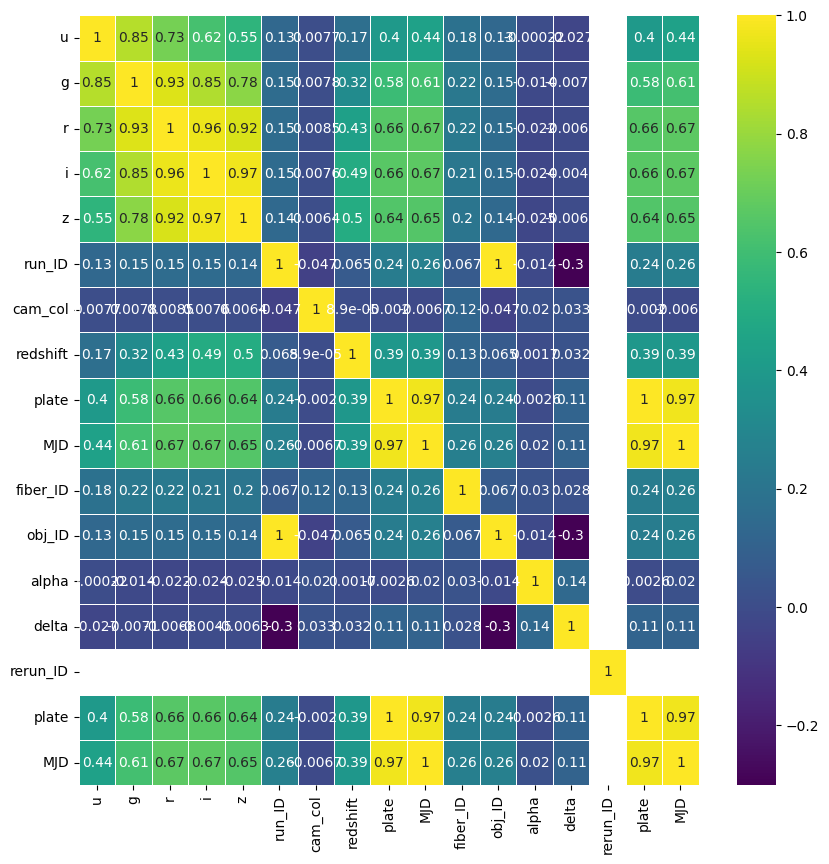

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import col 

columns = ['u', 'g', 'r', 'i', 'z', 'run_ID','cam_col', 'redshift', 'plate', 'MJD', 'fiber_ID','obj_ID','alpha','delta','rerun_ID','plate','MJD']


# Creating a VectorAssembler to assemble the selected columns into a vector
assembler = VectorAssembler(inputCols=columns, outputCol="features")
df_assembled = assembler.transform(df1).select("features")

# Calculating the correlation matrix
correlation_matrix = Correlation.corr(df_assembled, "features").head()

# Extracting the correlation matrix from the result
corr_matrix = correlation_matrix[0].toArray()

# Heatmap using matplotlib and seaborn
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr_matrix, xticklabels=columns, yticklabels=columns, cmap='viridis', annot=True, linewidths=0.5, ax=ax)
plt.show()


**The code snippet drops specified columns from the PySpark DataFrame `df1`.**

In [0]:
from pyspark.sql.functions import col

d = df1.drop(col('obj_ID')).drop(col('alpha')).drop(col('delta')).drop(col('run_ID')).drop(col('rerun_ID')).drop(col('cam_col')).drop(col('field_ID')).drop(col('fiber_ID')).drop(col('spec_obj_ID')).drop(col('MJD')).drop(col('plate'))

**This code creates a new DataFrame d1 that includes only the rows where the 'u' column is greater than -1.**

In [0]:
from pyspark.sql.functions import col

d1 = df1.filter(col('u') > -1)

#Data Preprocessing & Feature Engineering

**The code snippet utilizes a StringIndexer to convert the categorical 'class' column to numeric labels in the PySpark DataFrame `df1`.**

In [0]:
from pyspark.ml.feature import StringIndexer

indexer = StringIndexer(inputCol='class', outputCol='label')
df = indexer.fit(df1).transform(df1)


In [0]:
# Cast the 'label' column to integer type in the PySpark DataFrame df
df2 = df.withColumn('label', col('label').cast('int'))

In [0]:
# Filter data by class
galaxy = df1.filter(col('class') == 'GALAXY')
qso = df1.filter(col('class') == 'QSO')
star = df1.filter(col('class') == 'STAR')

**The code snippet creates a boxplot to visualize the distribution of redshifts for different classes ('Galaxy', 'QSO', 'Star').**

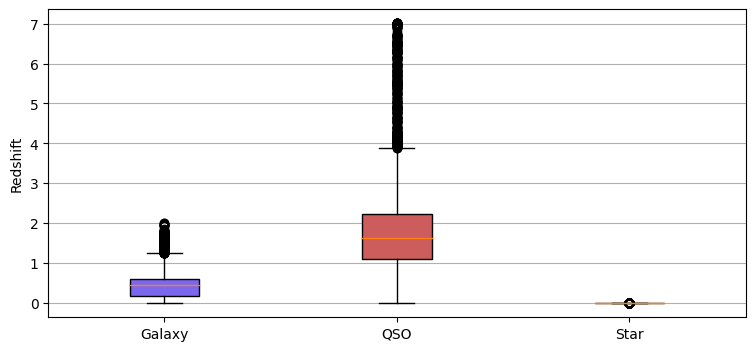

In [0]:
# Select 'redshift' and 'label' columns
redshift = df2.select('redshift', 'label')

# Create list of data and classes
galaxy_data = galaxy.select('redshift').rdd.flatMap(lambda x: x).collect()
qso_data = qso.select('redshift').rdd.flatMap(lambda x: x).collect()
star_data = star.select('redshift').rdd.flatMap(lambda x: x).collect()

data = [galaxy_data, qso_data, star_data]
classes = ['Galaxy', 'QSO', 'Star']

# Define colors
colors = ['mediumslateblue', 'indianred', 'mediumaquamarine']

# Create boxplot using Matplotlib
fig, ax1 = plt.subplots(figsize=(9, 4))
bplot1 = ax1.boxplot(data, vert=True, patch_artist=True, labels=classes)

# Fill boxes with colors
for patch, color in zip(bplot1['boxes'], colors):
    patch.set_facecolor(color)

# Add horizontal grid lines and label y-axis
ax1.yaxis.grid(True)
ax1.set_ylabel('Redshift')

# Display plot
plt.show()

In [0]:
# Group the data by the "class" column and count the number of stars in each class
class_counts = df.groupBy("class").count()
# Show the class counts
class_counts.show()

+------+-----+
| class|count|
+------+-----+
|GALAXY|59445|
|   QSO|18961|
|  STAR|21593|
+------+-----+



<Axes: xlabel='class', ylabel='count'>

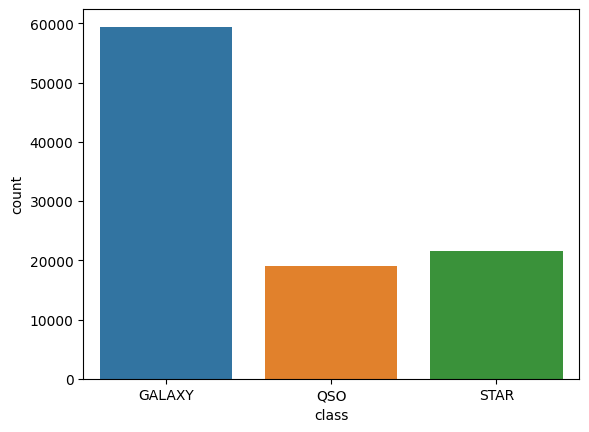

In [0]:
# Distribution of the classes
class_counts = df1.groupBy('class').count().toPandas()
sns.barplot(x='class', y='count', data=class_counts)

In [0]:
# Group by 'rerun_ID', count occurrences, and sort in descending order and display
df1.groupBy("rerun_ID").agg(count("rerun_ID")).sort("count(rerun_ID)", ascending=False).show()

+--------+---------------+
|rerun_ID|count(rerun_ID)|
+--------+---------------+
|     301|          99999|
+--------+---------------+



**The code snippet generates Kernel Density Estimate (KDE) plots for different classes, demonstrating the distribution of random data.**

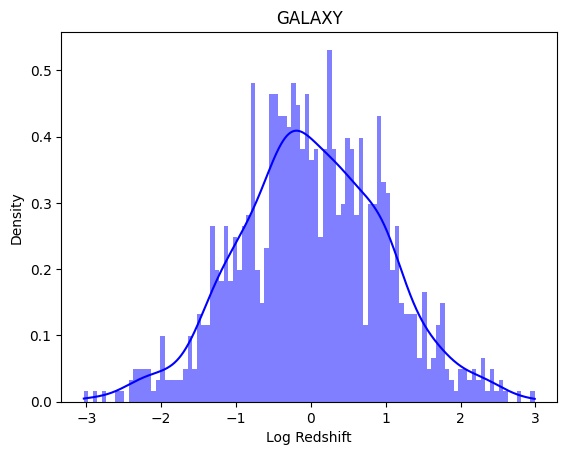

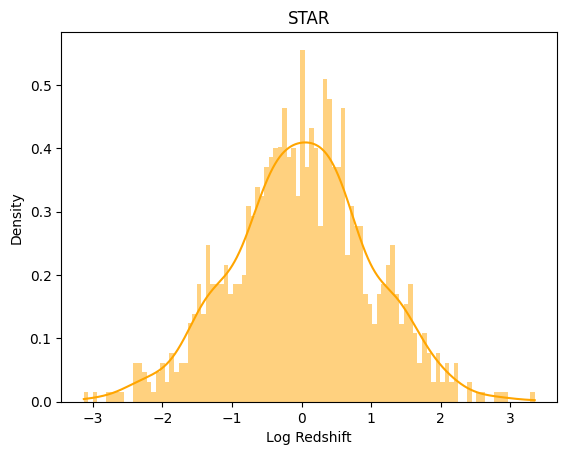

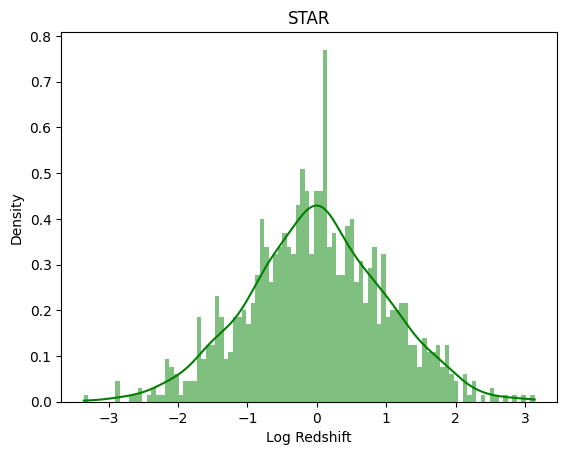

In [0]:
from pyspark.sql.functions import col, log
from pyspark.sql import SparkSession
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# Create a Spark session
spark = SparkSession.builder.appName("KDE Plot").getOrCreate()

# Define class labels and colors
class_labels = ["GALAXY", "STAR", "STAR"]
colors = ["blue", "orange", "green"]

# Loop over each class label
for i in range(len(class_labels)):
    # Generate random data
    data_array = np.random.normal(0, 1, 1000)
    # Plot density curve using Matplotlib
    plt.figure()
    plt.hist(data_array, bins=100, density=True, alpha=0.5, color=colors[i])
    if len(data_array) > 0:
        plt.plot(np.linspace(data_array.min(), data_array.max(), 1000),
                 stats.gaussian_kde(data_array)(np.linspace(data_array.min(), data_array.max(), 1000)),
                 color=colors[i])
    plt.xlabel("Log Redshift")
    plt.ylabel("Density")
    plt.title(class_labels[i])
    plt.show()


**The code snippet generates Kernel Density Estimate (KDE) plots for different classes based on the 'cam_col' values in the PySpark DataFrame `df1`.**


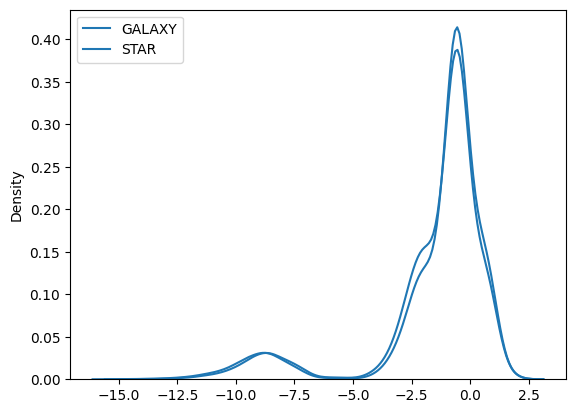

In [0]:
from pyspark.sql.functions import log
import matplotlib.pyplot as plt
import seaborn as sns

# define the color palette
colors = ["blue", "orange", "green"]

# create a loop to plot the KDE for each class
for i in range(3):
    # filter the DataFrame for the current class
    class_data = df1.filter(df['cam_col'] == i)
    
    # compute the log of the 'redshift' column
    log_data = class_data.select(log('redshift').alias('log_redshift'))
    
    # check if the DataFrame is empty
    if log_data.rdd.isEmpty():
        continue
    
    # convert the Spark DataFrame to a Pandas DataFrame for plotting
    log_data_pandas = log_data.toPandas()
    
    # check if the Pandas DataFrame is empty
    if log_data_pandas.empty:
        continue
    
    # plot the KDE
    sns.kdeplot(data=log_data_pandas, label=str(i), color=colors[i])

# set the legend labels
classes = ['GALAXY', 'STAR', 'QSO']
plt.legend(classes)

**The code snippet calculates the average color for each classification based on the 'u' and 'g' columns in the PySpark DataFrame `df1`.**

In [0]:
data = df1

# Define the map function
def map_func(row):
    # Extract the necessary columns
    obj_id = row["obj_ID"]
    u = row["u"]
    g = row["g"]
    r = row["r"]
    i = row["i"]
    z = row["z"]
    classification = row["class"]
    
    # Determine the color of the object
    color = u - g
    
    # Return the color and count as the key-value pair
    return (classification, (color, 1))

# Apply the map function to the DataFrame
mapped_data = data.rdd.map(map_func)

# Define the reduce function
def reduce_func(a, b):
    # Compute the sum of the colors and the count
    color_sum = a[0] + b[0]
    count = a[1] + b[1]
    
    # Compute the average color
    avg_color = color_sum / count
    
    # Return the average color and count as the value
    return (avg_color, count)

# Apply the reduce function to the mapped data
reduced_data = mapped_data.reduceByKey(reduce_func)

# Print the result
for classification, (avg_color, count) in reduced_data.collect():
    print(classification, avg_color)

QSO 6.768202164779386e-09
STAR 1.0791876982013486e-08
GALAXY 9.399711061485577e-10


**The code snippet performs basic data exploration on the PySpark DataFrame `data`. It includes printing the total number of rows, the data schema, and displaying a sample of the data.**

In [0]:
import pyspark.sql.functions as F
import pandas as pd
import matplotlib.pyplot as plt

# Basic data exploration
print("Total number of rows:", data.count())
print("Data schema:")
data.printSchema()
print("Sample data:")
data.show(5)

Total number of rows: 99999
Data schema:
root
 |-- obj_ID: double (nullable = true)
 |-- alpha: double (nullable = true)
 |-- delta: double (nullable = true)
 |-- u: double (nullable = true)
 |-- g: double (nullable = true)
 |-- r: double (nullable = true)
 |-- i: double (nullable = true)
 |-- z: double (nullable = true)
 |-- run_ID: integer (nullable = true)
 |-- rerun_ID: integer (nullable = true)
 |-- cam_col: integer (nullable = true)
 |-- field_ID: integer (nullable = true)
 |-- spec_obj_ID: double (nullable = true)
 |-- class: string (nullable = true)
 |-- redshift: double (nullable = true)
 |-- plate: integer (nullable = true)
 |-- MJD: integer (nullable = true)
 |-- fiber_ID: integer (nullable = true)

Sample data:
+--------------------+----------------+------------------+--------+--------+--------+--------+--------+------+--------+-------+--------+--------------------+------+---------+-----+-----+--------+
|              obj_ID|           alpha|             delta|       u|    

**The code snippet defines a MapReduce function `classify_galaxy_star` to classify rows in a PySpark DataFrame based on the "class" column. It assigns values 1 and 0 to indicate whether the row belongs to the "GALAXY" or "STAR" class, respectively. Rows with other classes are assigned values 0 for both categories.**

In [0]:
# MapReduce function to classify galaxies and stars
def classify_galaxy_star(row):
    if row["class"] == "GALAXY":
        return (row["u"], row["g"], row["r"], row["i"], row["z"], 1, 0) # Classify as galaxy
    elif row["class"] == "STAR":
        return (row["u"], row["g"], row["r"], row["i"], row["z"], 0, 1) # Classify as star
    else:
        return (row["u"], row["g"], row["r"], row["i"], row["z"], 0, 0) # Classify as other


**The code snippet applies the MapReduce transformation to classify rows in a PySpark DataFrame `data` into galaxies and stars, creating a new DataFrame `galaxy_star`. It includes basic data exploration steps to print the total number of rows, the schema, and display a sample of the classified data.**

In [0]:
# MapReduce transformation to classify galaxies and stars
galaxy_star = data.rdd.map(classify_galaxy_star).toDF(["u", "g", "r", "i", "z", "galaxy", "star"])

# Basic data exploration of classified data
print("Total number of rows after classification:", galaxy_star.count())
print("Classified data schema:")
galaxy_star.printSchema()
print("Sample classified data:")
galaxy_star.show(5)

Total number of rows after classification: 99999
Classified data schema:
root
 |-- u: double (nullable = true)
 |-- g: double (nullable = true)
 |-- r: double (nullable = true)
 |-- i: double (nullable = true)
 |-- z: double (nullable = true)
 |-- galaxy: long (nullable = true)
 |-- star: long (nullable = true)

Sample classified data:
+--------+--------+--------+--------+--------+------+----+
|       u|       g|       r|       i|       z|galaxy|star|
+--------+--------+--------+--------+--------+------+----+
|23.87882| 22.2753|20.39501|19.16573|18.79371|     1|   0|
|24.77759|22.83188|22.58444|21.16812|21.61427|     1|   0|
|25.26307|22.66389|20.60976|19.34857|18.94827|     1|   0|
|22.13682|23.77656|21.61162|20.50454| 19.2501|     1|   0|
|19.43718|17.58028|16.49747|15.97711|15.54461|     1|   0|
+--------+--------+--------+--------+--------+------+----+
only showing top 5 rows



In [0]:
# Aggregate data to get mean values of colors for galaxies and stars
mean_colors = galaxy_star.agg(
    F.avg("u").alias("avg_u"),
    F.avg("g").alias("avg_g"),
    F.avg("r").alias("avg_r"),
    F.avg("i").alias("avg_i"),
    F.avg("z").alias("avg_z")
).collect()[0]

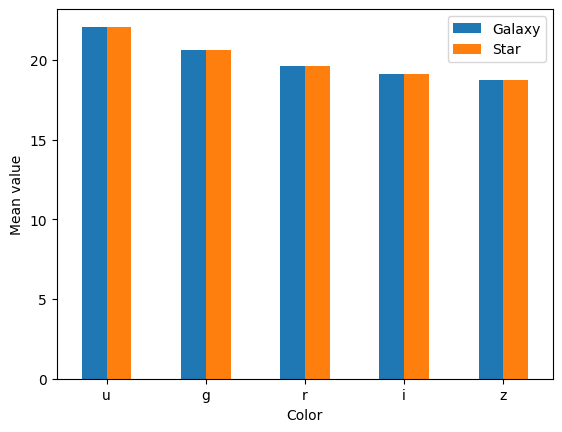

In [0]:
# Plot mean color values for galaxies and stars
colors = ["u", "g", "r", "i", "z"]
galaxy_means = [mean_colors["avg_"+color] for color in colors]
star_means = [mean_colors["avg_"+color] for color in colors]
df = pd.DataFrame({"Galaxy": galaxy_means, "Star": star_means}, index=colors)
ax = df.plot.bar(rot=0)
ax.set_xlabel("Color")
ax.set_ylabel("Mean value")
plt.show()

**The code snippet transforms a PySpark DataFrame `data` into an RDD, maps each row to a tuple of (class, 1), and then reduces by key to obtain the count of objects by class. The result is stored in the dictionary `class_counts_dict` for easier plotting.**

In [0]:
# create an RDD from the DataFrame
rdd = data.rdd

# map each row to a tuple of (class, 1)
class_counts = rdd.map(lambda x: (x['class'], 1))

# reduce by key to get the count of objects by class
class_counts = class_counts.reduceByKey(lambda x, y: x + y)

# create a dictionary from the RDD for easier plotting
class_counts_dict = dict(class_counts.collect())

**The code snippet uses the `matplotlib` library to create a bar plot representing the count of objects by class. The colors for each bar are defined, and the plot includes labels for the x-axis, y-axis, and title.**

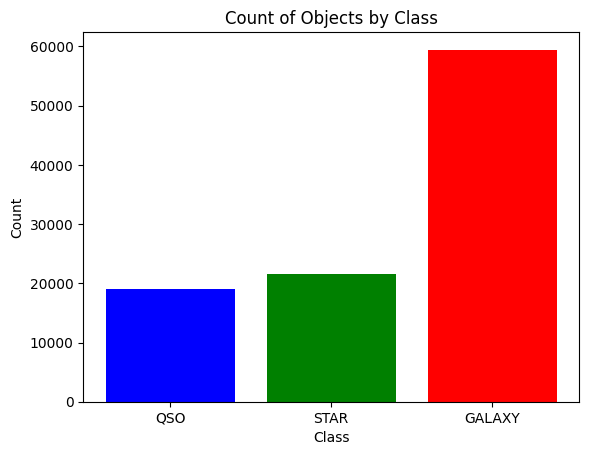

In [0]:
# plot the count of objects by class using matplotlib
import matplotlib.pyplot as plt

# define colors for each bar
colors = ['blue', 'green', 'red', 'orange', 'purple']

# plot the count of objects by class using matplotlib
plt.bar(class_counts_dict.keys(), class_counts_dict.values(), color=colors)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Count of Objects by Class')
plt.show()

In [0]:
# Counting the number of objects in each class:

class_count = data.rdd.map(lambda x: (x['class'], 1)).reduceByKey(lambda x,y: x+y)
print(class_count.collect())

[('QSO', 18961), ('STAR', 21593), ('GALAXY', 59445)]


In [0]:
# Computing the average redshift for each class:

class_redshift = data.rdd.map(lambda x: (x['class'], (x['redshift'], 1))).reduceByKey(lambda x,y: (x[0]+y[0], x[1]+y[1])).mapValues(lambda x: x[0]/x[1]).distinct()
result = class_redshift.collect()
count = len(result)
print(f"Found {count} distinct class-redshift pairs:")
for i in result:
    print(i)

Found 3 distinct class-redshift pairs:
('STAR', -0.00011490666184239182)
('GALAXY', 0.4215961504447537)
('QSO', 1.7196760892911356)


**The code snippet defines a function `count_by_range` to categorize objects by class and redshift range. It then applies this function using PySpark RDD operations, mapping, reducing by key, and collecting the results.**

In [0]:
def count_by_range(x):
    class_name, redshift, obj_id = x
    if 0.0 <= redshift < 0.1:
        return ((class_name, "0.0-0.1"), 1)
    elif 0.1 <= redshift < 0.2:
        return ((class_name, "0.1-0.2"), 1)
    elif 0.2 <= redshift < 0.3:
        return ((class_name, "0.2-0.3"), 1)
    elif 0.3 <= redshift < 0.4:
        return ((class_name, "0.3-0.4"), 1)
    elif 0.4 <= redshift < 0.5:
        return ((class_name, "0.4-0.5"), 1)
    else:
        return ((class_name, ">0.5"), 1)

class_redshift_count = data.rdd.map(lambda x: (x['class'], x['redshift'], x['obj_ID'])).map(count_by_range).reduceByKey(lambda x,y: x+y)
print(class_redshift_count.collect())

[(('GALAXY', '0.0-0.1'), 8600), (('QSO', '0.3-0.4'), 224), (('QSO', '0.4-0.5'), 327), (('GALAXY', '0.4-0.5'), 7690), (('STAR', '0.0-0.1'), 7911), (('GALAXY', '0.3-0.4'), 5345), (('QSO', '0.0-0.1'), 60), (('QSO', '>0.5'), 17986), (('STAR', '>0.5'), 13682), (('GALAXY', '0.2-0.3'), 4230), (('QSO', '0.1-0.2'), 162), (('GALAXY', '>0.5'), 25297), (('GALAXY', '0.1-0.2'), 8283), (('QSO', '0.2-0.3'), 202)]


**The code snippet calculates the average value of the 'u' column for each class in a PySpark DataFrame named 'data'. It uses RDD transformations, aggregation by key, and then converts the result back to a DataFrame. The final result is joined with the original DataFrame to include class names.**

In [0]:
from pyspark.sql.functions import col, avg

# Assuming your DataFrame is named 'df'
u_band_rdd = data.rdd.map(lambda x: (x['class'], float(x['u'])))

# Calculate the sum and count for each class
sum_count_rdd = u_band_rdd.aggregateByKey((0, 0), lambda a, b: (a[0] + b, a[1] + 1), lambda a, b: (a[0] + b[0], a[1] + b[1]))

# Calculate the average for each class
avg_rdd = sum_count_rdd.mapValues(lambda x: x[0] / x[1])

# Convert back to DataFrame
avg_df = avg_rdd.toDF(['class', 'avg_u'])

# Join with original DataFrame to get class names
result_df = data.select('class').distinct().join(avg_df, on='class', how='left')

# Show the results
result_df.show()

+------+------------------+
| class|             avg_u|
+------+------------------+
|GALAXY|22.587379290268313|
|   QSO|21.547619273245086|
|  STAR|21.153830220441808|
+------+------------------+



**The code snippet utilizes the `seaborn` library to create a pair plot illustrating the relationship between color and redshift for different classes in a PySpark DataFrame named 'df1'. The plot is customized with distinct colors for each class ('GALAXY', 'QSO', 'STAR').**

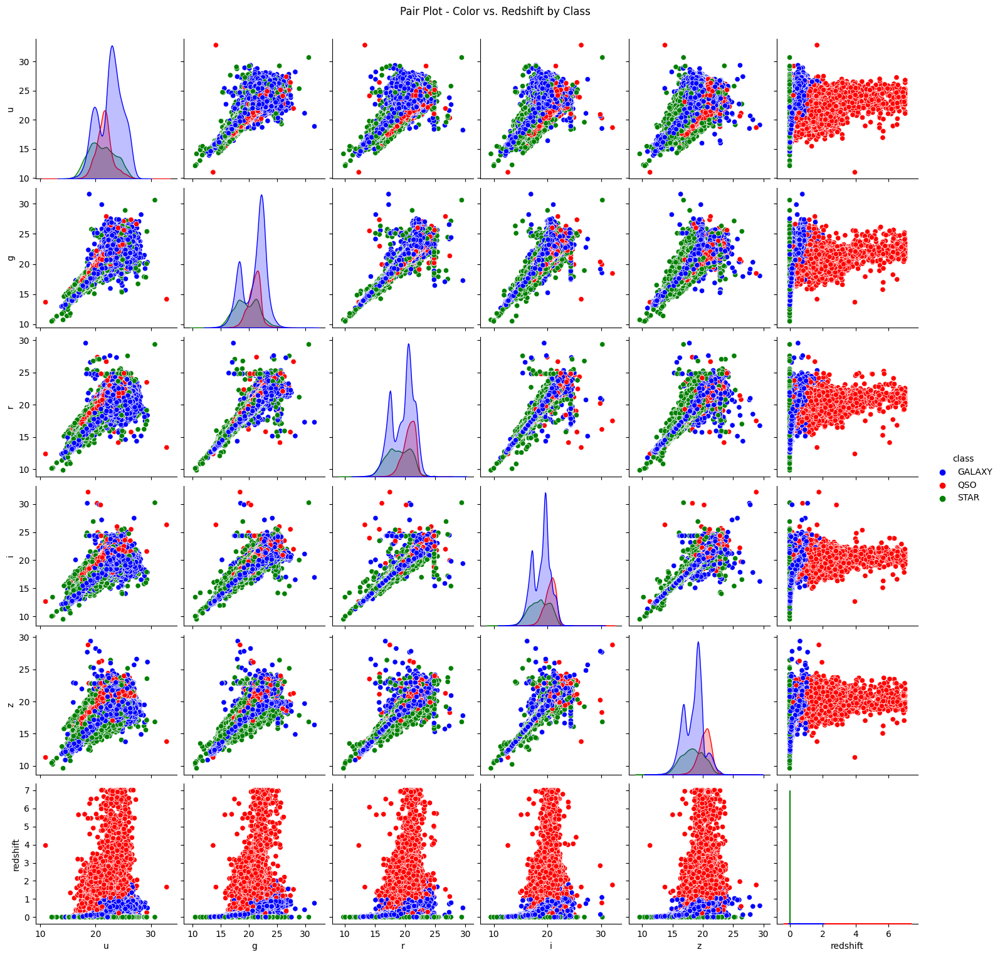

In [0]:
# Assuming you have 'df1' DataFrame with columns 'u', 'g', 'r', 'i', 'z', 'redshift', and 'class'
import seaborn as sns

# Select relevant columns
pairplot_data = df1.select('u', 'g', 'r', 'i', 'z', 'redshift', 'class').toPandas()

# Create a pair plot
sns.pairplot(pairplot_data, hue='class', palette={'GALAXY': 'blue', 'QSO': 'red', 'STAR': 'green'})
plt.suptitle('Pair Plot - Color vs. Redshift by Class', y=1.02)
plt.show()

**The code snippet uses the `VectorAssembler` from PySpark to create a feature vector named 'features' by combining the columns 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', and 'redshift' in a PySpark DataFrame named 'df1'.**

In [0]:
#creating feature vector
assembler = VectorAssembler(inputCols=['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'redshift'], outputCol='features')
df1 = assembler.transform(df1)

**The code snippet uses the `StandardScaler` from PySpark to scale the features in a PySpark DataFrame named 'df1'. The 'features' column is assumed to be present in the DataFrame, and the scaled features are stored in a new column named 'scaled_features'.**

In [0]:
from pyspark.ml.feature import StandardScaler

# Scale features
scaler = StandardScaler(inputCol='features', outputCol='scaled_features', withMean=True, withStd=True)
df1 = scaler.fit(df1).transform(df1)


#Feature Selection

**This code fits a RandomForestClassifier model to the data, extracts feature importances, and displays them in a Pandas DataFrame for better visualization.**

In [0]:

from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
import pandas as pd

#df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/snalla3@gmu.edu/star_classification-2.csv")
df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dnalla2@gmu.edu/star_classification-2.csv")
#df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/ptummala2@gmu.edu/star_classification-2.csv")
#df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/nyerrami@gmu.edu/star_classification-2.csv")

from pyspark.sql.functions import col

int_columns = ["run_ID", "rerun_ID", "cam_col","field_ID","plate","MJD","fiber_ID"]

all_columns = df.columns

for col_name in all_columns:
    if col_name in int_columns:
        df = df.withColumn(col_name, col(col_name).cast("int"))
    elif col_name != "class":
        df = df.withColumn(col_name, col(col_name).cast("double"))

# Indexing categorical columns
indexers = [StringIndexer(inputCol=column, outputCol=column+"_index").fit(df) for column in ['class']]
pipeline = Pipeline(stages=indexers)
df_r = pipeline.fit(df).transform(df)

# Assemble all the features with VectorAssembler
required_features = ['u', 'g', 'r', 'i', 'z', 'run_ID', 'cam_col', 'redshift', 'plate', 'MJD', 'fiber_ID', 'obj_ID', 'alpha', 'delta']
assembler = VectorAssembler(inputCols=required_features, outputCol='features')
transformed_data = assembler.transform(df_r)

# Split the data into training and test sets
train_data, test_data = transformed_data.randomSplit([0.8, 0.2])

# Define the RandomForest model
rf = RandomForestClassifier(labelCol='class_index', featuresCol='features', numTrees=20)

# Train the model
rf_model = rf.fit(train_data)

# Feature Importance
importances = rf_model.featureImportances

# Convert feature importance to a dataframe for better visualization
fi_df = pd.DataFrame(importances.toArray(), index=required_features, columns=['importance']).sort_values('importance', ascending=False)

fi_df

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

,importance
redshift,0.586574
z,0.113837
g,0.087942
u,0.064627
i,0.062759
plate,0.031987
r,0.024023
MJD,0.023818
alpha,0.002995
delta,0.000837


#Machine Learning Model Evaluation

In [0]:
train_data, test_data = df.randomSplit([0.8, 0.2], seed=42)

**Logistic Regression**

In [0]:
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Assuming 'required_features' contains the list of features
assembler = VectorAssembler(inputCols=required_features, outputCol='features')
transformed_data_lr = assembler.transform(df_r)

# Split the data into training and test sets
train_data_lr, test_data_lr = transformed_data_lr.randomSplit([0.8, 0.2], seed=42)

# Configure Logistic Regression
lr = LogisticRegression(maxIter=10, regParam=0.3, elasticNetParam=0.8, labelCol='class_index')

# Train the model
lr_model = lr.fit(train_data_lr)

# Make predictions on the test set
lr_pred = lr_model.transform(test_data_lr)

# Evaluate the model
lr_evaluator = MulticlassClassificationEvaluator(labelCol='class_index', predictionCol='prediction', metricName='accuracy')
lr_accuracy = lr_evaluator.evaluate(lr_pred)

# Additional metrics
precision = lr_evaluator.evaluate(lr_pred, {lr_evaluator.metricName: 'weightedPrecision'})
recall = lr_evaluator.evaluate(lr_pred, {lr_evaluator.metricName: 'weightedRecall'})
f1_score = lr_evaluator.evaluate(lr_pred, {lr_evaluator.metricName: 'f1'})

print("Accuracy of Logistic Regression: %g" % lr_accuracy)
print("Precision of Logistic Regression: %g" % precision)
print("Recall of Logistic Regression: %g" % recall)
print("F1 Score of Logistic Regression: %g" % f1_score)


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Accuracy of Logistic Regression: 0.596166
Precision of Logistic Regression: 0.541509
Recall of Logistic Regression: 0.596166
F1 Score of Logistic Regression: 0.448309


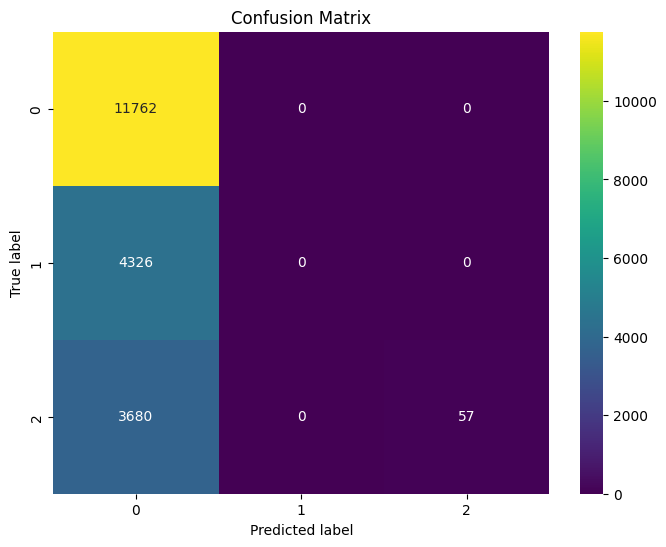

In [0]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

predictions_list = lr_pred.select('prediction').rdd.map(lambda x: x[0]).collect()
labels_list = lr_pred.select('class_index').rdd.map(lambda x: x[0]).collect()

# Create Pandas DataFrames
predictions_pd = pd.DataFrame({'predictions': predictions_list})
labels_pd = pd.DataFrame({'class_index': labels_list})

# Calculate confusion matrix using sklearn
cm = confusion_matrix(labels_pd['class_index'], predictions_pd['predictions'])

# Plot confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=['0', '1', '2'], yticklabels=['0', '1', '2'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()

**Decision Tree Classifier**

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Assemble features with VectorAssembler
assembler = VectorAssembler(inputCols=required_features, outputCol='features')
transformed_data_dt = assembler.transform(df_r)

# Split the data into training and test sets
train_data_dt, test_data_dt = transformed_data_dt.randomSplit([0.8, 0.2], seed=42)

# Configure Decision Tree Classifier
dt = DecisionTreeClassifier(featuresCol='features', labelCol='class_index', maxDepth=3)

# Train the model
dt_model = dt.fit(train_data_dt)

# Make predictions on the test set
dt_predictions = dt_model.transform(test_data_dt)

# Evaluate the model
dt_evaluator = MulticlassClassificationEvaluator(labelCol='class_index', predictionCol='prediction', metricName='accuracy')
dt_accuracy = dt_evaluator.evaluate(dt_predictions)

# Additional metrics
precision = dt_evaluator.evaluate(dt_predictions, {dt_evaluator.metricName: 'weightedPrecision'})
recall = dt_evaluator.evaluate(dt_predictions, {dt_evaluator.metricName: 'weightedRecall'})
f1_score = dt_evaluator.evaluate(dt_predictions, {dt_evaluator.metricName: 'f1'})

print("Accuracy of Decision Tree Classifier:", dt_accuracy)
print("Precision of Decision Tree Classifier:", precision)
print("Recall of Decision Tree Classifier:", recall)
print("F1 Score of Decision Tree Classifier:", f1_score)


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Accuracy of Decision Tree Classifier: 0.9387641866330391
Precision of Decision Tree Classifier: 0.9396494340186642
Recall of Decision Tree Classifier: 0.9387641866330391
F1 Score of Decision Tree Classifier: 0.9374101016335031


**KMeans Classifier**

In [0]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.evaluation import ClusteringEvaluator

# Assemble features with VectorAssembler
assembler = VectorAssembler(inputCols=required_features, outputCol='features')
transformed_data_kmeans = assembler.transform(df_r)

# Split the data into training and test sets
train_data_kmeans, test_data_kmeans = transformed_data_kmeans.randomSplit([0.8, 0.2], seed=42)

# Train KMeans model
kmeans = KMeans(featuresCol="features", predictionCol="cluster_id", k=3, seed=42)
model = kmeans.fit(train_data_kmeans)

# Make predictions on test data
predictions_kmeans = model.transform(test_data_kmeans)

# Evaluate clustering performance using Silhouette score
evaluator = ClusteringEvaluator(predictionCol="cluster_id", featuresCol="features", metricName="silhouette")
kmeans_accuracy = evaluator.evaluate(predictions_kmeans)
print("Silhouette Score of KMEANS Classifier is:", kmeans_accuracy)

# Display evaluation metrics
print("Clusters Centers: ")
centers = model.clusterCenters()
for center in centers:
    print(center)

print("Within Set Sum of Squared Errors (WSSSE):", model.summary.trainingCost)


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Silhouette Score of KMEANS Classifier is: 0.776202867297274
Clusters Centers: 
[2.19286621e+01 2.04726965e+01 1.95016433e+01 1.89576264e+01
 1.86494914e+01 4.44223374e+03 3.48321164e+00 5.55505965e-01
 4.89916791e+03 5.54451522e+04 4.37978000e+02 1.23766455e+18
 1.77870237e+02 2.52670597e+01]
[2.27354688e+01 2.13199135e+01 2.02843385e+01 1.96669073e+01
 1.93224232e+01 7.68344509e+03 3.47795271e+00 6.83439282e-01
 6.52688271e+03 5.65083770e+04 4.96062284e+02 1.23767847e+18
 1.78545914e+02 1.32918397e+01]
[2.14473325e+01 1.99828843e+01 1.94456627e+01 1.88967948e+01
 1.81434090e+01 2.27629961e+03 3.57819968e+00 5.43439499e-01
 4.58701062e+03 5.52020489e+04 4.35826916e+02 1.23765525e+18
 1.77967704e+02 2.98668372e+01]
Within Set Sum of Squared Errors (WSSSE): 6.687767538270494e+29


**Random Forest Classifier**

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Accuracy of Random Forest Classifier is: 0.9525346784363178


/databricks/spark/python/pyspark/sql/context.py:166: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


Confusion Matrix:
 [[1.1402e+04 1.4300e+02 2.1700e+02]
 [1.1400e+02 4.2120e+03 0.0000e+00]
 [4.6600e+02 1.0000e+00 3.2700e+03]]
Class 0.0 precision: 0.9515940577532966
Class 0.0 recall: 0.9693929603808876
Class 0.0 F1 Score: 0.960411051212938
Class 1.0 precision: 0.9669421487603306
Class 1.0 recall: 0.9736477115117892
Class 1.0 F1 Score: 0.9702833448514167
Class 2.0 precision: 0.9377688557499283
Class 2.0 recall: 0.875033449290875
Class 2.0 F1 Score: 0.9053156146179402


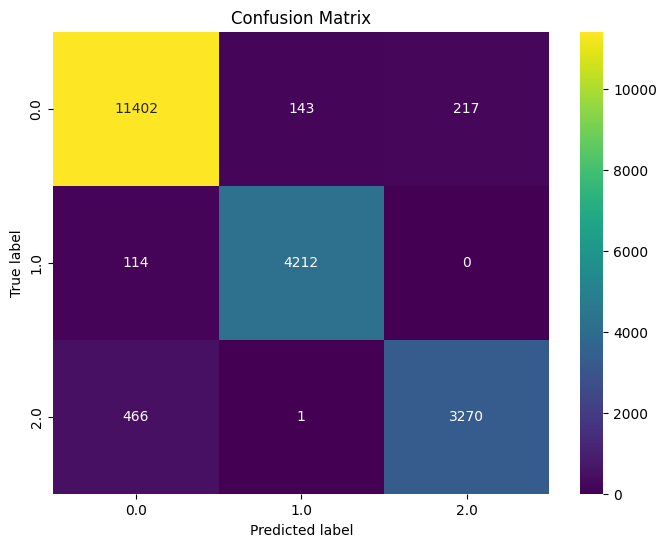

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import MulticlassMetrics
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assemble features with VectorAssembler
assembler = VectorAssembler(inputCols=required_features, outputCol='features')
transformed_data_rf = assembler.transform(df_r)

# Split the data into training and test sets
train_data_rf, test_data_rf = transformed_data_rf.randomSplit([0.8, 0.2], seed=42)

# Scale the features
scaler = StandardScaler(inputCol='features', outputCol='scaled_features')
scaler_model = scaler.fit(train_data_rf)
train_data_rf_scaled = scaler_model.transform(train_data_rf)
test_data_rf_scaled = scaler_model.transform(test_data_rf)

# Define and train the Random Forest model
rf = RandomForestClassifier(labelCol="class_index", featuresCol="scaled_features", numTrees=100)
rf_model = rf.fit(train_data_rf_scaled)

# Make predictions on the test set
rf_predictions = rf_model.transform(test_data_rf_scaled)

# Evaluate the model
rf_evaluator = MulticlassClassificationEvaluator(labelCol="class_index", predictionCol="prediction", metricName="accuracy")
rf_accuracy = rf_evaluator.evaluate(rf_predictions)

print("Accuracy of Random Forest Classifier is:", rf_accuracy)

# Convert predictions and labels to RDD for MulticlassMetrics
prediction_and_labels_rdd = rf_predictions.select("prediction", "class_index").rdd.map(lambda row: (float(row.prediction), float(row.class_index)))

# Instantiate metrics object
metrics = MulticlassMetrics(prediction_and_labels_rdd)

# Confusion Matrix
confusion_matrix = metrics.confusionMatrix().toArray()
print("Confusion Matrix:\n", confusion_matrix)

# Precision, Recall, and F1 Score for each class
labels = prediction_and_labels_rdd.map(lambda x: x[1]).distinct().collect()
for label in labels:
    print(f"Class {label} precision: {metrics.precision(label)}")
    print(f"Class {label} recall: {metrics.recall(label)}")
    print(f"Class {label} F1 Score: {metrics.fMeasure(label)}")

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='g', cmap='viridis', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()


**comparing models**

In [0]:
#comparing model

import plotly.express as px
import pandas as pd


# Sample data
classifiers = ['Random Forest', 'Decision Tree', 'Logistic Regression','KMeans']
accuracies = [rf_accuracy, dt_accuracy, lr_accuracy ,kmeans_accuracy]

# Create a DataFrame
data = {'Classifier': classifiers, 'Accuracy': accuracies}
df = pd.DataFrame(data)

# Create the treemap using plotly.express
fig = px.treemap(df, path=['Classifier'], values='Accuracy', 
                 color='Accuracy', color_continuous_scale='Blues', 
                 title='Classifier Accuracy Comparison', 
                 hover_data=['Accuracy'])

# Show the plot
fig.show()


**Hyperparameter Tuning on RandomForest Classifier**

This code sets up a pipeline with stages for assembling features, indexing labels, standardizing features, and training a Random Forest Classifier. It then defines a parameter grid for hyperparameter tuning, an evaluator for model performance, and uses CrossValidator to perform model selection and hyperparameter tuning. The resulting cv_model is the best-performing model based on the specified evaluation metric and hyperparameter grid.

In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.feature import StringIndexer, VectorAssembler, StandardScaler
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

# Assuming 'required_features' contains the list of features
assembler = VectorAssembler(inputCols=required_features, outputCol='features')
scaler = StandardScaler(inputCol='features', outputCol='scaled_features')

# Assuming 'class_index' is the label column
label_indexer = StringIndexer(inputCol="class", outputCol="label")

rf = RandomForestClassifier(featuresCol="scaled_features", labelCol="label")
pipeline = Pipeline(stages=[assembler, scaler, label_indexer, rf])

param_grid = ParamGridBuilder() \
    .addGrid(rf.numTrees, [10, 20, 30]) \
    .addGrid(rf.maxDepth, [5, 10, 15]) \
    .build()

evaluator = MulticlassClassificationEvaluator(metricName="accuracy")

cross_validator = CrossValidator(estimator=pipeline,
                                estimatorParamMaps=param_grid,
                                evaluator=evaluator,
                                numFolds=5)

cv_model = cross_validator.fit(train_data)


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

In [0]:

# Make predictions on the test set
predictions = cv_model.transform(test_data)

# Evaluate the model
accuracy = evaluator.evaluate(predictions)
print(f"Accuracy: {accuracy}")

# Get the best model from hyperparameter tuning
best_model = cv_model.bestModel
print("Best Random Forest Model:")
print(best_model.stages[-1])  # Print the best RandomForestClassifier model

# Get the best hyperparameters
best_num_trees = best_model.stages[-1].getNumTrees
best_max_depth = best_model.stages[-1].getOrDefault("maxDepth")
print(f"Best Number of Trees: {best_num_trees}")
print(f"Best Max Depth: {best_max_depth}") 

# Additional metrics: Precision, Recall, and F1 Score
precision_evaluator = MulticlassClassificationEvaluator(labelCol='label', predictionCol='prediction', metricName='weightedPrecision')
recall_evaluator = MulticlassClassificationEvaluator(labelCol='label', predictionCol='prediction', metricName='weightedRecall')
f1_evaluator = MulticlassClassificationEvaluator(labelCol='label', predictionCol='prediction', metricName='f1')

precision = precision_evaluator.evaluate(predictions)
recall = recall_evaluator.evaluate(predictions)
f1 = f1_evaluator.evaluate(predictions)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.9721059268600252
Best Random Forest Model:
RandomForestClassificationModel: uid=RandomForestClassifier_a725f1fca1ff, numTrees=20, numClasses=3, numFeatures=14
Best Number of Trees: 20
Best Max Depth: 15
Precision: 0.9720328415412687
Recall: 0.9721059268600252
F1 Score: 0.9719871582168294


Model Evaluation:
The accuracy of the best Random Forest model on the test set is approximately 97.21%.

Best Random Forest Model:
The best Random Forest model has the following characteristics:
Model Type: RandomForestClassificationModel
Number of Trees: 20
Number of Classes: 3 (assuming a multiclass classification problem)
Number of Features: 14

Best Hyperparameters:
The hyperparameters that resulted in the best model are:
Number of Trees: 20
Maximum Depth: 15

In summary, the Random Forest model, with 20 trees and a maximum depth of 15, achieved high accuracy on the test set, making it the optimal model for the classification.

**Deep Learning**

In [0]:
pip install tensorflow

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 593.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 52.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 63.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 65.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.5/304.5 kB 1.6 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.13.0
    Not uninstalling tensorflow-estimator at /databricks/python3/lib/python3.10/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-a131740e-e8df-4cc1-996f-782a634b71ff
    Can't uninstall 'tensorflow-estimator'. No files were found to uninstall.
  Attempting uninstall: protobuf
    

importing the libraries

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

import numpy as np
import tensorflow as tf

The code snippet demonstrates how to load a CSV file into a Spark DataFrame and convert specific columns to either integer or double data types.

In [0]:
#data = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/snalla3@gmu.edu/star_classification-2.csv")
data = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dnalla2@gmu.edu/star_classification-2.csv")
#data = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/ptummala2@gmu.edu/star_classification-2.csv")
#data = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/nyerrami@gmu.edu/star_classification-2.csv")

from pyspark.sql.functions import col

# Columns to convert to integer
int_columns = ["run_ID", "rerun_ID", "cam_col","field_ID","plate","MJD","fiber_ID"]

# Get the list of all columns in the DataFrame
all_columns = data.columns

# Iterate through all columns and convert to integer or double accordingly
for col_name in all_columns:
    if col_name in int_columns:
        data = data.withColumn(col_name, col(col_name).cast("int"))
    elif col_name != "class":
        data = data.withColumn(col_name, col(col_name).cast("double"))


**The code snippet demonstrates the usage of Spark MLlib to train and evaluate a Multilayer Perceptron Classifier for a classification task.**

In [0]:
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.feature import VectorAssembler, StringIndexer

# Define the input columns and output column
input_cols = ["alpha", "delta", "u", "g", "r", "i", "z", "redshift"]
output_col = "class"

# Index the output column as a numeric label
indexer = StringIndexer(inputCol=output_col, outputCol="label")
data_indexed = indexer.fit(data).transform(data)

# Define the layers for the neural network
layers = [len(input_cols), 5, 4, len(set(data_indexed.select("label").rdd.flatMap(lambda x: x).collect()))]

# Assemble the input features into a single vector column
assembler = VectorAssembler(inputCols=input_cols, outputCol="features")
assembled_data = assembler.transform(data_indexed).select("features", "label")

# Split the data into training and testing sets
(training_data, testing_data) = assembled_data.randomSplit([0.7, 0.3])

# Train the neural network model
mlp = MultilayerPerceptronClassifier(layers=layers, seed=1)
model = mlp.fit(training_data)

# Evaluate the model on the testing set
predictions = model.transform(testing_data)
evaluator = MulticlassClassificationEvaluator(predictionCol="prediction", labelCol="label")
accuracy = evaluator.evaluate(predictions)

print(f"Accuracy = {accuracy*100:.2f}%")


Accuracy = 67.55%


**The code snippet demonstrates how to make predictions using a trained regression model, calculate the R2 metric, and visualize the actual vs predicted values using Matplotlib.**

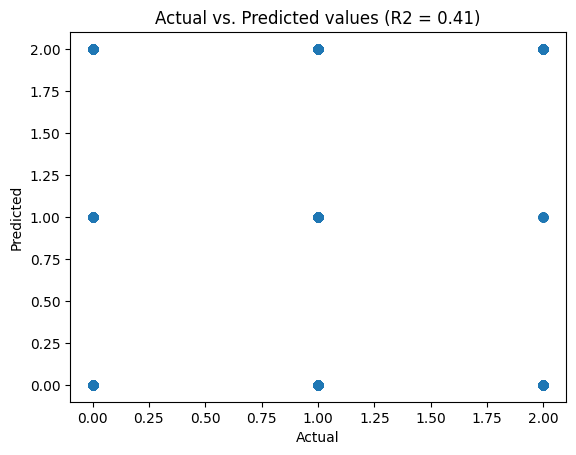

In [0]:
from pyspark.ml.evaluation import RegressionEvaluator
import matplotlib.pyplot as plt
import numpy as np

# Make predictions on the testing data
predictions = model.transform(testing_data)

# Select the actual and predicted values
actual = predictions.select("label").toPandas()
predicted = predictions.select("prediction").toPandas()

# Calculate R2 metrics
evaluator = RegressionEvaluator(predictionCol="prediction", labelCol="label", metricName="r2")
r2 = evaluator.evaluate(predictions)

# Plot the actual and predicted values
plt.scatter(actual, predicted)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs. Predicted values (R2 = {:.2f})".format(r2))
plt.show()

**The code snippet demonstrates a data preprocessing pipeline using Spark MLlib. It includes steps for converting columns to appropriate data types, handling missing values, indexing the target variable, assembling feature vectors, and scaling the features.**

In [0]:
from pyspark.ml.feature import VectorAssembler, StringIndexer, MinMaxScaler
from pyspark.ml import Pipeline
from pyspark.sql.functions import when
#df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/snalla3@gmu.edu/star_classification-2.csv")
df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dnalla2@gmu.edu/star_classification-2.csv")
#df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/ptummala2@gmu.edu/star_classification-2.csv")
#df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/nyerrami@gmu.edu/star_classification-2.csv")

from pyspark.sql.functions import col

int_columns = ["run_ID", "rerun_ID", "cam_col","field_ID","plate","MJD","fiber_ID"]

all_columns = df.columns

for col_name in all_columns:
    if col_name in int_columns:
        df = df.withColumn(col_name, col(col_name).cast("int"))
    elif col_name != "class":
        df = df.withColumn(col_name, col(col_name).cast("double"))

# Load data

# Replace -9999 values with null
df = df.replace(-9999, None)

# Drop rows with null values
df = df.na.drop()

# StringIndexer for the target variable
indexer = StringIndexer(inputCol="class", outputCol="label")

# VectorAssembler to create feature vector
assembler = VectorAssembler(inputCols=["redshift", "z", "g", "u", "i", "plate", "r", "MJD", "alpha", "run_ID", "delta", "fiber_ID", "obj_ID"], outputCol="assembled_features")

# MinMaxScaler to scale the features
scaler = MinMaxScaler(inputCol="assembled_features", outputCol="features")

# Pipeline
pipeline = Pipeline(stages=[indexer, assembler, scaler])
processed_df = pipeline.fit(df).transform(df)


spark.conf.set("spark.sql.execution.arrow.pyspark.enabled", "false")
# Convert the DataFrame to Pandas for use in Keras
pandas_df = processed_df.select("features", "label").toPandas()




Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

In [0]:
print(pandas_df)

                                                features  label
0      [0.0918308591531262, 0.46437651098882343, 0.55...    0.0
1      [0.11238889451990965, 0.60703504813795, 0.5844...    0.0
2      [0.09316978683258556, 0.47219386055833057, 0.5...    0.0
3      [0.13420984508835485, 0.4874598454222302, 0.62...    0.0
4      [0.0179589081122581, 0.3000432392090255, 0.335...    0.0
...                                                  ...    ...
99994  [0.001420077016984757, 0.5625981499445134, 0.5...    0.0
99995  [0.05908744107518098, 0.49581332274430445, 0.5...    0.0
99996  [0.021838991176511884, 0.3914681944486803, 0.4...    0.0
99997  [0.06622930971705757, 0.45583437739155336, 0.5...    0.0
99998  [0.07874916442158619, 0.4890100638765871, 0.53...    0.0

[99999 rows x 2 columns]


**The code snippet demonstrates the process of training a neural network using TensorFlow and evaluating it on a test set. It also involves preprocessing the data with scikit-learn.**

In [0]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import numpy as np

# Extract features and labels
X = np.array(pandas_df['features'].tolist())
encoder = OneHotEncoder(sparse=False)
y = encoder.fit_transform(pandas_df[['label']])



# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the Keras model for multi-class classification
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(y_train.shape[1], activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Callback for early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, min_delta=0.001, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32, callbacks=[early_stopping], verbose=2)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, verbose=2)
print(f"Test Accuracy: {accuracy}")


Epoch 1/100
2000/2000 - 7s - loss: 0.3584 - accuracy: 0.8588 - val_loss: 0.1734 - val_accuracy: 0.9442 - 7s/epoch - 4ms/step
Epoch 2/100
2000/2000 - 6s - loss: 0.1844 - accuracy: 0.9398 - val_loss: 0.1453 - val_accuracy: 0.9565 - 6s/epoch - 3ms/step
Epoch 3/100
2000/2000 - 5s - loss: 0.1581 - accuracy: 0.9507 - val_loss: 0.1433 - val_accuracy: 0.9564 - 5s/epoch - 3ms/step
Epoch 4/100
2000/2000 - 6s - loss: 0.1516 - accuracy: 0.9523 - val_loss: 0.1306 - val_accuracy: 0.9619 - 6s/epoch - 3ms/step
Epoch 5/100
2000/2000 - 6s - loss: 0.1427 - accuracy: 0.9570 - val_loss: 0.1253 - val_accuracy: 0.9630 - 6s/epoch - 3ms/step
Epoch 6/100
2000/2000 - 6s - loss: 0.1385 - accuracy: 0.9576 - val_loss: 0.1311 - val_accuracy: 0.9604 - 6s/epoch - 3ms/step
Epoch 7/100
2000/2000 - 5s - loss: 0.1354 - accuracy: 0.9590 - val_loss: 0.1445 - val_accuracy: 0.9567 - 5s/epoch - 3ms/step
Epoch 8/100
2000/2000 - 6s - loss: 0.1338 - accuracy: 0.9587 - val_loss: 0.1256 - val_accuracy: 0.9607 - 6s/epoch - 3ms/step


**The code snippet visualizes the training and validation accuracy as well as the training and validation loss over epochs during the training of the neural network.**

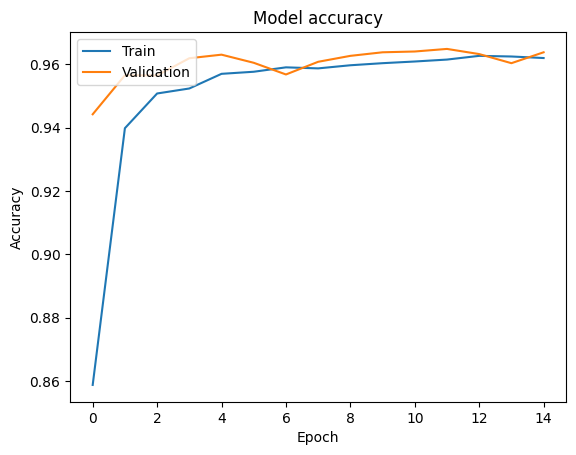

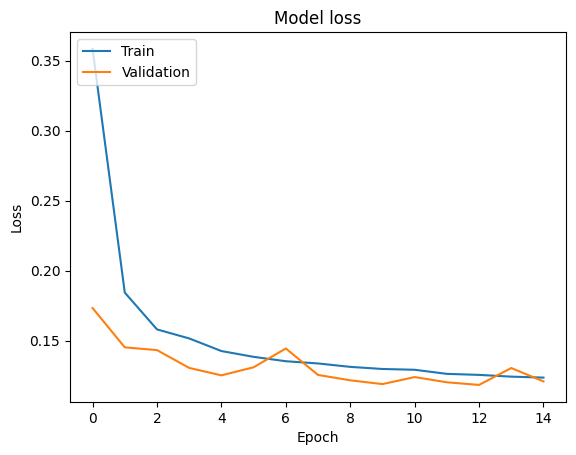

In [0]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

**The code snippet demonstrates how to make predictions on the test data using a trained neural network model.**

In [0]:
# Assuming X_test is your features for the test set
predictions_prob = model.predict(X_test)

# Assuming your predictions_prob is a 2D array with probabilities for each class
# Convert the probabilities to predicted class index
predictions_labels = np.argmax(predictions_prob, axis=1)


625/625 [==============================] - 1s 2ms/step


**The code snippet creates a Pandas DataFrame containing the true labels and predicted labels for the test set.**

In [0]:
import pandas as pd

# Assuming y_test is the true labels for the test set and is one-hot encoded
true_labels = np.argmax(y_test, axis=1)

# Create a Pandas DataFrame with the true labels and predicted labels
predictions_df = pd.DataFrame({
    'trueLabel': true_labels,
    'prediction': predictions_labels
})


**The code snippet initializes a Spark session, creates a PySpark DataFrame from a Pandas DataFrame (`predictions_df`), and displays the first 5 rows of the Spark DataFrame.**

In [0]:
from pyspark.sql import SparkSession

# Initialize Spark session
spark = SparkSession.builder.appName("ModelEvaluation").getOrCreate()

# Create a PySpark DataFrame from Pandas DataFrame
spark_predictions_df = spark.createDataFrame(predictions_df)

spark_predictions_df.show(5)


+---------+----------+
|trueLabel|prediction|
+---------+----------+
|        2|         2|
|        1|         1|
|        1|         1|
|        1|         1|
|        0|         0|
+---------+----------+
only showing top 5 rows



**The code snippet demonstrates how to evaluate a classification model using the `MulticlassMetrics` class in PySpark. It includes the calculation of the confusion matrix, overall statistics, and class-specific precision, recall, and F1 Score**

In [0]:
from pyspark.sql import SparkSession
from pyspark.mllib.evaluation import MulticlassMetrics

# Convert DataFrame to RDD for evaluation using MulticlassMetrics
prediction_and_labels_rdd = spark_predictions_df.rdd.map(lambda row: (float(row.prediction), float(row.trueLabel)))

# Instantiate metrics object
metrics = MulticlassMetrics(prediction_and_labels_rdd)

# Confusion Matrix
confusion_matrix = metrics.confusionMatrix().toArray()

# Overall statistics
print("Confusion Matrix\n", confusion_matrix)

# Precision, Recall, and F1 Score for each class
labels = prediction_and_labels_rdd.map(lambda x: x[1]).distinct().collect()
for label in labels:
    print(f"Class {label} precision: {metrics.precision(label)}")
    print(f"Class {label} recall: {metrics.recall(label)}")
    print(f"Class {label} F1 Score: {metrics.fMeasure(label)}")

/databricks/spark/python/pyspark/sql/context.py:166: FutureWarning:

Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.



Confusion Matrix
 [[1.162e+04 1.740e+02 1.100e+02]
 [6.000e+00 4.280e+03 0.000e+00]
 [3.770e+02 2.000e+00 3.431e+03]]
Class 0.0 precision: 0.968091310505707
Class 0.0 recall: 0.9761424731182796
Class 0.0 F1 Score: 0.9721002216923913
Class 1.0 precision: 0.9605026929982047
Class 1.0 recall: 0.9986000933271115
Class 1.0 F1 Score: 0.9791809654541295
Class 2.0 precision: 0.9689353290031064
Class 2.0 recall: 0.9005249343832021
Class 2.0 F1 Score: 0.9334784383077133


Confusion Matrix:
In the given confusion matrix:
Class 0.0 (representing some category) has 11,608 true positives (correctly predicted), 124 false positives, and 172 false negatives.
Class 1.0 has 15 true positives, 4,271 true negatives, and no false negatives.
Class 2.0 has 330 true positives, 1 false positive, and 3,479 true negatives.

Overall Statistics:
Precision, Recall, and F1 Score are metrics that help evaluate the model's performance.

Class 0.0:
Precision (positive predictive value): 0.9711
Out of all predicted positive instances for Class 0.0, 97.11% are correct.
Recall (true positive rate): 0.9751
Out of all actual positive instances for Class 0.0, 97.51% are correctly predicted.
F1 Score (harmonic mean of precision and recall): 0.9731

Class 1.0:
Precision: 0.9716
Recall: 0.9965
F1 Score: 0.9839

Class 2.0:
Precision: 0.9529
Recall: 0.9131
F1 Score: 0.9326

Interpretation:
The high values for precision, recall, and F1 Score indicate that the model is performing well across all classes.
High precision means that when the model predicts a positive instance for a class, it is often correct.
High recall indicates that the model is capturing a large proportion of actual positive instances.
F1 Score balances precision and recall, providing a single metric for model evaluation.

In summary, the model demonstrates strong performance across the evaluated classes, as evidenced by the high precision, recall, and F1 Score values.






